<a href="https://colab.research.google.com/github/ramkiramanathan/NLPIMDB/blob/main/NLPIMDB.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
df = pd.read_csv('/archive.zip')
df.head(2)
# sentences = nltk.sent_tokenize(df)
# sentences

,review,sentiment
0,One of the other reviewers has mentioned that ...,positive
1,A wonderful little production. <br /><br />The...,positive


## Removing Punctuations

In [ ]:
df['review'] = df['review'].str.replace('[^a-zA-Z0-9]',' ')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  """Entry point for launching an IPython kernel.


In [ ]:
df['review']

0        One of the other reviewers has mentioned that ...
1        A wonderful little production   br    br   The...
2        I thought this was a wonderful way to spend ti...
3        Basically there s a family where a little boy ...
4        Petter Mattei s  Love in the Time of Money  is...
                               ...                        
49995    I thought this movie did a down right good job...
49996    Bad plot  bad dialogue  bad acting  idiotic di...
49997    I am a Catholic taught in parochial elementary...
49998    I m going to have to disagree with the previou...
49999    No one expects the Star Trek movies to be high...
Name: review, Length: 50000, dtype: object

## Converting to lowercase

In [ ]:
df['review'] = df['review'].str.lower()
df['review']

0        one of the other reviewers has mentioned that ...
1        a wonderful little production   br    br   the...
2        i thought this was a wonderful way to spend ti...
3        basically there s a family where a little boy ...
4        petter mattei s  love in the time of money  is...
                               ...                        
49995    i thought this movie did a down right good job...
49996    bad plot  bad dialogue  bad acting  idiotic di...
49997    i am a catholic taught in parochial elementary...
49998    i m going to have to disagree with the previou...
49999    no one expects the star trek movies to be high...
Name: review, Length: 50000, dtype: object

## Removing small words

In [ ]:
df['review'] = df['review'].apply(lambda row : ' '.join([word for word in row.split() if len(word)>2 ]))
df['review']

0        one the other reviewers has mentioned that aft...
1        wonderful little production the filming techni...
2        thought this was wonderful way spend time too ...
3        basically there family where little boy jake t...
4        petter mattei love the time money visually stu...
                               ...                        
49995    thought this movie did down right good job was...
49996    bad plot bad dialogue bad acting idiotic direc...
49997    catholic taught parochial elementary schools n...
49998    going have disagree with the previous comment ...
49999    one expects the star trek movies high art but ...
Name: review, Length: 50000, dtype: object

## Removing stopwords

In [ ]:
from nltk.corpus import stopwords
stop_words = stopwords.words('english')

In [ ]:
df['review'] = df['review'].apply(lambda row : ' '.join([word for word in row.split() if word not in stop_words]))
df['review']

0        one reviewers mentioned watching episode hooke...
1        wonderful little production filming technique ...
2        thought wonderful way spend time hot summer we...
3        basically family little boy jake thinks zombie...
4        petter mattei love time money visually stunnin...
                               ...                        
49995    thought movie right good job creative original...
49996    bad plot bad dialogue bad acting idiotic direc...
49997    catholic taught parochial elementary schools n...
49998    going disagree previous comment side maltin on...
49999    one expects star trek movies high art fans exp...
Name: review, Length: 50000, dtype: object

## Lemmatization

In [ ]:
from nltk.corpus import wordnet
from nltk.stem import WordNetLemmatizer
nltk.download('omw-1.4')
Lemma = WordNetLemmatizer()

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [ ]:
def pos_value(word):
  if word.startswith('J'):
    return wordnet.ADJ
  elif word.startswith('V'):
    return wordnet.VERB
  elif word.startswith('R'):
    return wordnet.ADV
  elif word.startswith('N'):
    return wordnet.NOUN
  else:
    return None
  

def lemmatize(sent):
  word_tagged = nltk.pos_tag(nltk.word_tokenize(sent))
  cor_tagged = map(lambda x: (x[0],pos_value(x[1])),word_tagged)
  Lemmatize_sent = []
  for word, tag in cor_tagged:
    if tag is None:
      Lemmatize_sent.append(word)
    else:
      Lemmatize_sent.append(Lemma.lemmatize(word,tag))
  return ' '.join(Lemmatize_sent)

df['review'] = df['review'].apply(lambda x: lemmatize(x))

In [ ]:
df['review']

0        one reviewer mention watch episode hook right ...
1        wonderful little production film technique una...
2        think wonderful way spend time hot summer week...
3        basically family little boy jake think zombie ...
4        petter mattei love time money visually stunnin...
                               ...                        
49995    think movie right good job creative original f...
49996    bad plot bad dialogue bad act idiotic direct a...
49997    catholic teach parochial elementary school nun...
49998    go disagree previous comment side maltin one s...
49999    one expect star trek movie high art fan expect...
Name: review, Length: 50000, dtype: object

In [ ]:
df.head(2)

,review,sentiment
0,one reviewer mention watch episode hook right ...,positive
1,wonderful little production film technique una...,positive


In [ ]:
df['sentiment'] = df['sentiment'].map({'positive':1,'negative':0})
df.head(2)

,review,sentiment
0,one reviewer mention watch episode hook right ...,1
1,wonderful little production film technique una...,1


In [ ]:
df.to_csv('imdb_cleaned.csv')

In [ ]:
df.dtypes

review       object
sentiment     int64
dtype: object

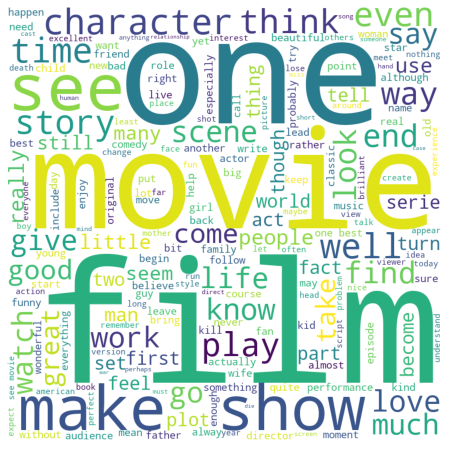

In [ ]:
##
## Bilding a Word Cloud
## 
import matplotlib.pyplot as plt
from wordcloud import WordCloud
word_cloud_df = df.loc[df['sentiment'] == 1,:]
all_words = ' '.join([text for text in word_cloud_df['review']])
 

wordcloud = WordCloud(width = 800, height = 800, 
                      background_color ='white', 
                      min_font_size = 10).generate(all_words)

#plot the WordCloud image                        
plt.figure(figsize = (8, 8)) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.show()

In [ ]:
all_words

'one reviewer mention watch episode hook right exactly happen first thing struck brutality unflinching scene violence set right word trust show faint hearted timid show pull punch regard drug sex violence hardcore classic use word call nickname give oswald maximum security state penitentary focus mainly emerald city experimental section prison cell glass front face inwards privacy high agenda city home many aryan muslim gangstas latinos christian italian irish scuffle death stare dodgy dealing shady agreement never far away would say main appeal show due fact go show dare forget pretty picture paint mainstream audience forget charm forget romance mess around first episode ever saw struck nasty surreal say ready watch developed taste get accustomed high level graphic violence violence injustice crook guard sell nickel inmate kill order get away well mannered middle class inmate turn prison bitch due lack street skill prison experience watching may become comfortable uncomfortable view t

## TF-IDF Vectorization

In [ ]:
import pandas as pd
df = pd.read_csv('/content/imdb_cleaned.csv')
del df['Unnamed: 0']

In [ ]:
df.head(2)


,review,sentiment
0,one reviewer mention watch episode hook right ...,1
1,wonderful little production film technique una...,1


In [ ]:
df.shape

(9999, 2)

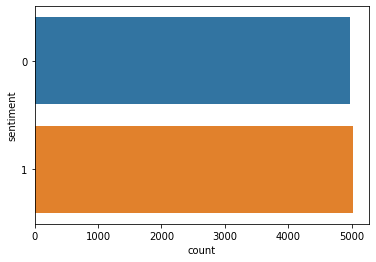

In [ ]:
import seaborn as sns
sns.countplot(y = 'sentiment', data = df)

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer()
x = tfidf.fit_transform(df.review).toarray()
y = df.sentiment.values
feature_names = tfidf.get_feature_names

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test = train_test_split(x,y,stratify = y, test_size=0.2)

## ANN

In [ ]:
import tensorflow
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

In [ ]:
model = Sequential([
    Dense(1000, activation = 'relu', kernel_initializer = 'he_uniform'),
    Dropout(0.8),
    Dense(500, activation = 'sigmoid'),
    Dropout(0.8),
    Dense(250, activation = 'relu', kernel_initializer = 'he_uniform'),
    Dropout(0.8),
    Dense(1, activation = 'sigmoid')
])

In [ ]:
model.compile(optimizer = 'Adam' , loss = 'BinaryCrossentropy' , metrics = ['accuracy'])

In [ ]:
model.fit(X_train , Y_train , epochs=10 , validation_split=0.2 , batch_size=32)

Epoch 1/10
200/200 [==============================] - 55s 269ms/step - loss: 0.9489 - accuracy: 0.5034 - val_loss: 0.6927 - val_accuracy: 0.4944
Epoch 2/10
200/200 [==============================] - 52s 258ms/step - loss: 0.7165 - accuracy: 0.5066 - val_loss: 0.6927 - val_accuracy: 0.5063
Epoch 3/10
200/200 [==============================] - 51s 257ms/step - loss: 0.6917 - accuracy: 0.5331 - val_loss: 0.6831 - val_accuracy: 0.6275
Epoch 4/10
200/200 [==============================] - 52s 258ms/step - loss: 0.5034 - accuracy: 0.7456 - val_loss: 0.2955 - val_accuracy: 0.8819
Epoch 5/10
200/200 [==============================] - 52s 261ms/step - loss: 0.2292 - accuracy: 0.9216 - val_loss: 0.2692 - val_accuracy: 0.8869
Epoch 6/10
200/200 [==============================] - 53s 264ms/step - loss: 0.1252 - accuracy: 0.9581 - val_loss: 0.3283 - val_accuracy: 0.8863
Epoch 7/10
200/200 [==============================] - 53s 263ms/step - loss: 0.0672 - accuracy: 0.9770 - val_loss: 0.4322 - val_ac